# Predicting y values for Telecommunications Dataset

Objective:
- Create a time series forecasting model for the data attached in the directory. 
	- Granularity: Daily
	- Forecast Horizon: 1 Year (Argue if you think it should be otherwise for some cases)

Data Schema:
- cell_name: Categorical Feature simulating different radios which can occur in a network
- ds: Timeseries datetime
- y: Target Feature to model. 


Submission Format:
- You can use .ipynb to submit your results. Google Colabs works as well. 
- Prepare a few bullet points describing your understanding of this problem and how it can be used/translated in real-world scenarios.

## Step 1: Understanding the Data

### 1.1 Importing Libraries

In [349]:
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.stats.multicomp import MultiComparison
import statsmodels.api as sm

from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima

import warnings
warnings.filterwarnings("ignore")

### 1.2 Basic Data Check and Cleaning

In [350]:
df = pd.read_csv('exercise_data.csv', parse_dates=['ds'], dtype={'cell_name': 'category'})

print('\n\n################################################# Dataset Head:\n\n', df.head)
print('\n\n################################################# Column Data types:\n\n', df.dtypes)
print('\n\n################################################# Null values:\n\n', df.isnull().sum())
print('\n\n################################################# Dataset Description:\n\n', df.describe())



################################################# Dataset Head:

 <bound method NDFrame.head of           cell_name                        ds          y
0       cell_name_0 2022-03-10 00:00:00+00:00  20.833125
1       cell_name_0 2022-03-11 00:00:00+00:00  18.681812
2       cell_name_0 2022-03-12 00:00:00+00:00  21.314250
3       cell_name_0 2022-03-14 00:00:00+00:00  20.291187
4       cell_name_0 2022-03-15 00:00:00+00:00  18.972062
...             ...                       ...        ...
11167  cell_name_19 2023-10-20 00:00:00+00:00  36.424250
11168  cell_name_19 2023-10-21 00:00:00+00:00  39.057750
11169  cell_name_19 2023-10-22 00:00:00+00:00  43.937063
11170  cell_name_19 2023-10-23 00:00:00+00:00  41.486250
11171  cell_name_19 2023-10-24 00:00:00+00:00  38.868187

[11172 rows x 3 columns]>


################################################# Column Data types:

 cell_name               category
ds           datetime64[ns, UTC]
y                        float64
dtype: object


###

<p>Everything looks good, no cleaning required. Moving on...</p>

## Step 2: Basic Statistical Calculation

<p> The values of y are collected for different cells in the network. There might be a relation between the y values of different cells if the cells are linked to each other in the network. However, the different count of data points suggests that the y values for each cells were collected independently, so I will treat them to be independent of each other.</p>

<p> This problem can be explored in various ways:
<ol>
    <li>
    <b>Network Analysis -</b> Studying the cellular network itself to see how the y values change with the differnet nodes(cells) in the network. We can epxlore if the network structure itself is a factor affecting the y values, and if so then how. This method would involve network related metrics such as centrality metrics, degree distribuition, clustering coefficients, etc. It would also require more data pertaining to the network itself.
    </li>
    </br>
    <li>
    <b>Conventional Statistical Analysis -</b> Studying the relation between the input values cell_name and datetime information with respect to the y values. While this approach would provide us with the insights about the relationship between the inputs and the outputs, it will overlook the crucial temporal aspect of the data. Therefore, I will use metrics from conventional statistical analysis but the modeling of the data will not be based on this approach.
    </li>
    </br>
    <li>
    <b>Time Series Analysis -</b> Studying the trend, seasonality, and cyclic nature (if any) of the data with respect to time. This approach will be the most suitable one to model the data provided, since it would allow me to accommodate for the temporal dependencies of the y values.
    </li>
</ol>

### 2.1 Comparison to Normality

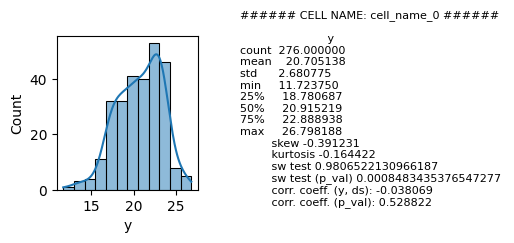

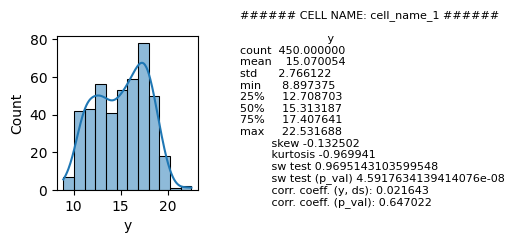

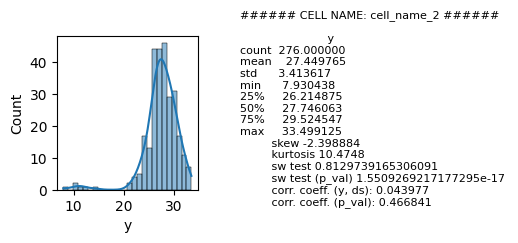

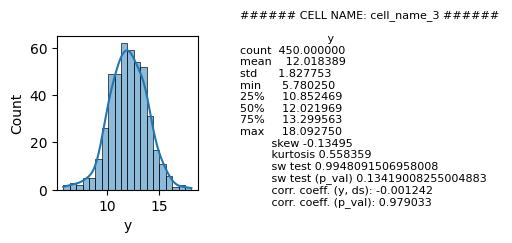

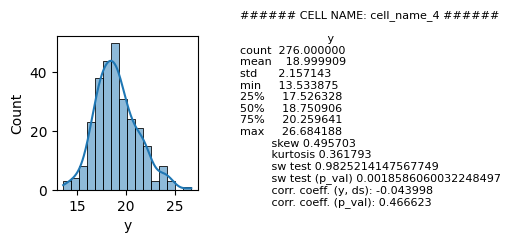

...

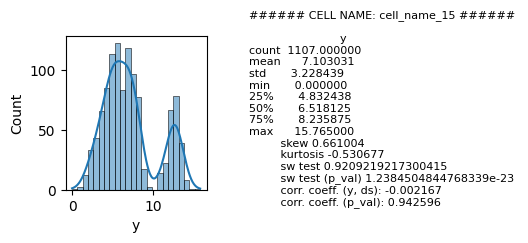

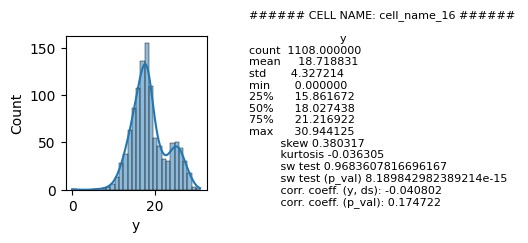

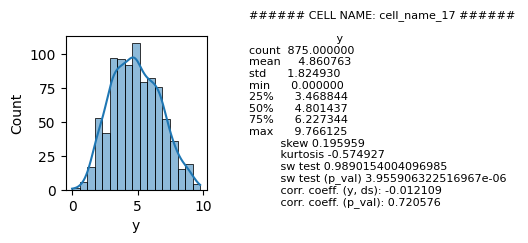

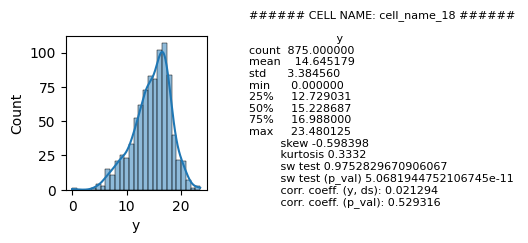

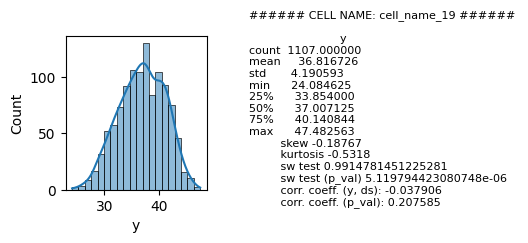

In [351]:
def basic_stats(df, cell_name):
    
    cell_data = df[df['cell_name']==cell_name]
    cell_data_dates = pd.to_numeric(cell_data.ds.dt.day)
    
    r, p = sp.stats.pearsonr(cell_data.y, cell_data_dates)
    corr_ceff = round(r,6)
    corr_ceff_p_val = round(p,6)

    skew = round(sp.stats.skew(cell_data.y, bias=False),6)
    kurtosis = round(sp.stats.kurtosis(cell_data.y, bias=False),6)
    sw_stat, p_val = sp.stats.shapiro(cell_data.y)

    formatted_string = f'###### CELL NAME: {cell_name} ###### \n\n \
        {cell_data.describe()} \n \
        skew {skew} \n \
        kurtosis {kurtosis} \n \
        sw test {sw_stat} \n \
        sw test (p_val) {p_val} \n \
        corr. coeff. (y, ds): {corr_ceff} \n \
        corr. coeff. (p_val): {corr_ceff_p_val}'
    
    return formatted_string

cell_names = df.cell_name.unique()

for cell_name in cell_names:

    fig, axs = plt.subplots(1, 2, figsize=(4, 2))
    plot = sns.histplot(df[df['cell_name']==cell_name].y, kde=True, ax=axs[0])
    
    axs[1].text(x=0.1, y=-0.1, s=basic_stats(df, cell_name), fontsize=8)
    axs[1].axis('off')
    axs[1].set_frame_on(False)

<p>
<ul>
    <li><b>Count -</b> The different count of y values for each cell implies that the dataset is imbalanced.</li>
    </br>
    <li><b>Mean -</b> The difference in mean y values for each cell implies that feature cell_name affects the y values. To check how significant is this effect, we need to tperform a t-test.</li>
    </br>
    <li><b>Standad Deviation -</b> The standard deviation will let us know the spread of the y values for each cell. A low standard deviation implies that the y values do not change a lot over time for the particular cell.</li>
    </br>
    <li><b>Min and Max -</b> The lower and upper bounds give us an idea of the range that the values of y is lie in. (Range = Max - Min)</li>
    </br>
    <li><b>Quartiles -</b> The values of y for which the data is divided into four parts.</li>
    </br>
    <li><b>Skew -</b> The skew of the distrubution (also apparent from the graph) tells us which side and by how much this distribution is skewed compared to the Normal Distribution. All skews, except for the ones for cell 2 and cell 10, lie between -1 and 1. This means that most y value distributions are not too far away from a typical Normal Distribution Thus, we can use metrics and processes developed for Normal distribution to study these distributions.</li>
    </br>
    <li><b>Kurtosis -</b> Indicates how vertically squished the distribution is compared to the Normal Distribution. This metric along with skewness can help us identify whether this data distribution is close to a Normal Distribution or not. We can use the Shapiro-Wilk test to do that.</li>
    </br>
    <li><b>SW test metrics -</b> The distributions of y that have a skewness and kurtosis of close to 0 have the highest of SW scores, which are most of them. Thus, most y value distributions for the given cells are normally distributed.</li>
    </br>
    <li><b>Correlation Coefficient -</b> Give us the information of how y values change with respect to Time. Negatively correlated values decrease with time, and vice-versa.</li>
</ul>
</p>


#### QQ Plots

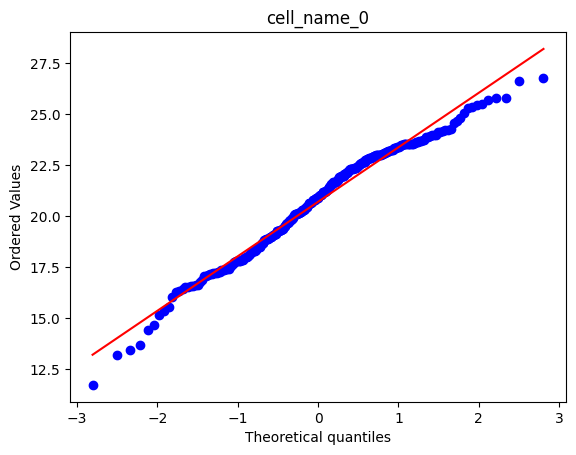

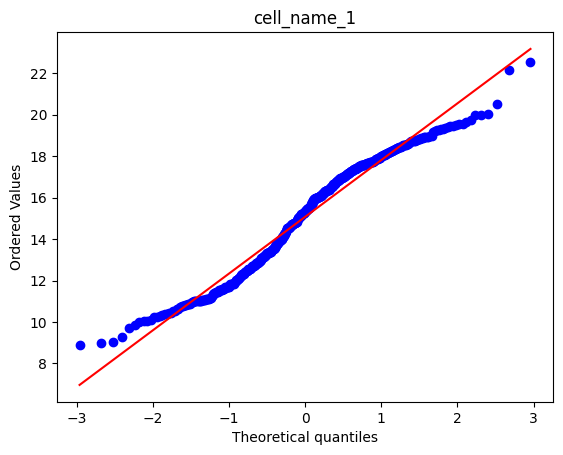

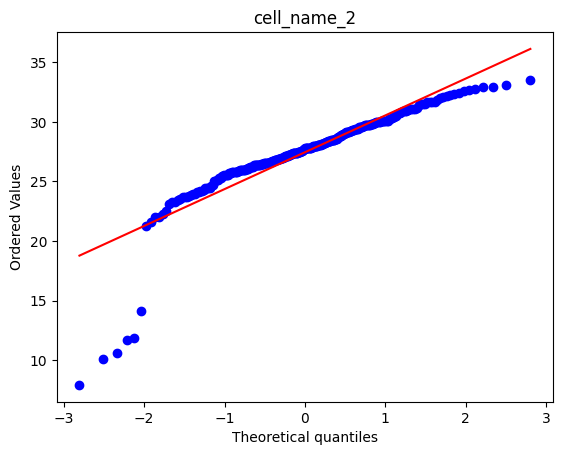

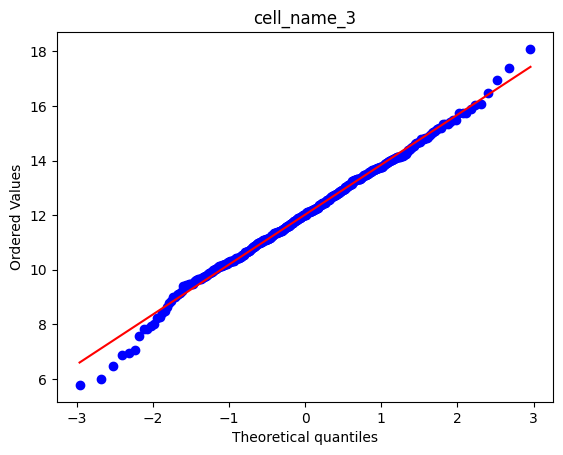

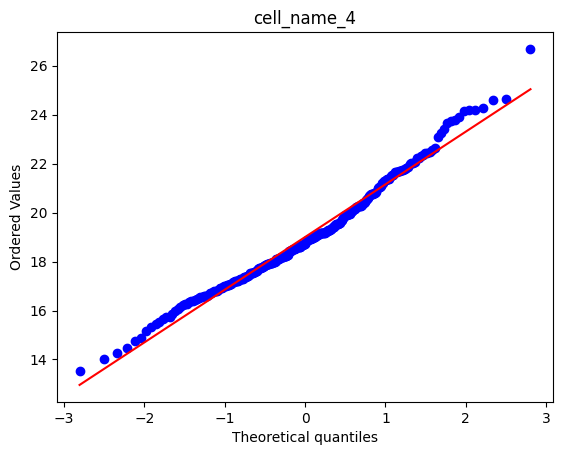

...

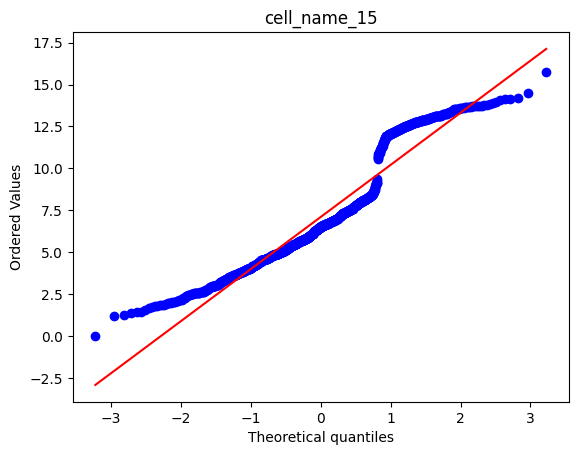

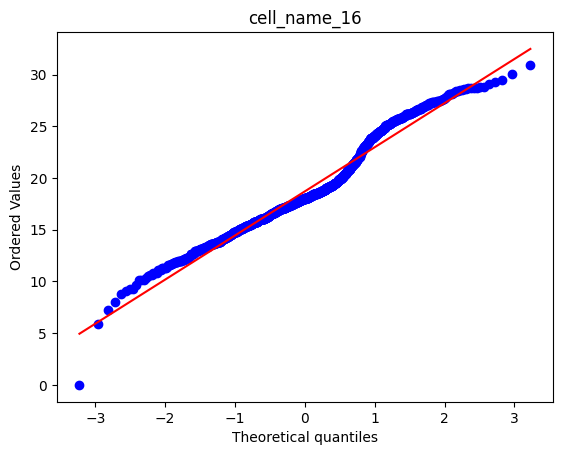

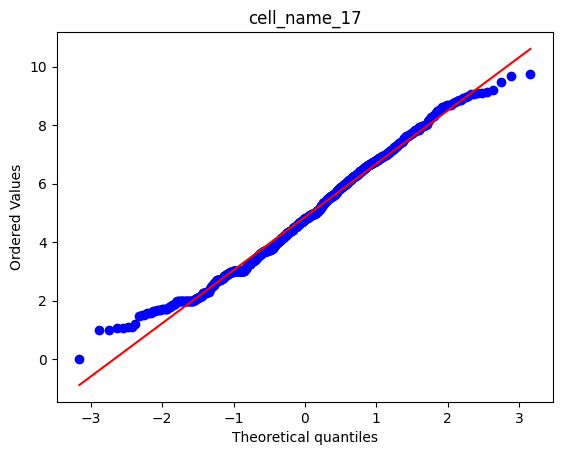

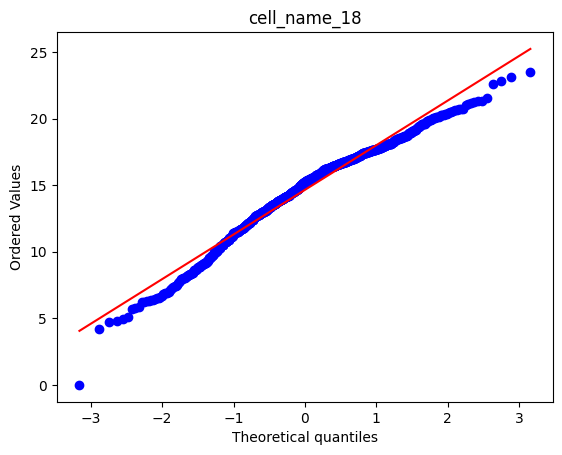

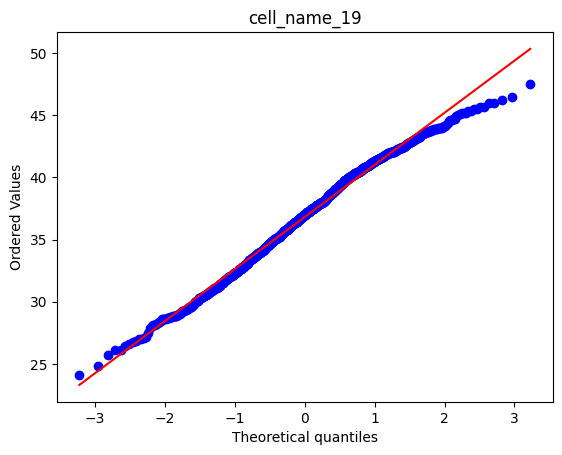

In [352]:
for cell_name in cell_names:
    sp.stats.probplot(df[df['cell_name']==cell_name].y, plot=plt)
    plt.title(f'{cell_name}')
    plt.show()

<p>
Comparing quartiles of the actual distributions and the distributions of y values tells us that most of the series are similar to a Normal Distribution.
</p>

### 2.2 Measuring the effect of the cell_name on the y values

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
   group1       group2    meandiff p-adj   lower    upper   reject
------------------------------------------------------------------
 cell_name_0  cell_name_1  -5.6351    0.0  -6.5507  -4.7195   True
 cell_name_0 cell_name_10  11.7586    0.0  10.7392   12.778   True
 cell_name_0 cell_name_11  -5.9426    0.0  -6.8578  -5.0274   True
 cell_name_0 cell_name_12  -8.7934    0.0  -9.6688  -7.9179   True
 cell_name_0 cell_name_13  -9.0595    0.0  -9.9352  -8.1838   True
 cell_name_0 cell_name_14  -3.1133    0.0   -3.989  -2.2376   True
 cell_name_0 cell_name_15 -13.6021    0.0 -14.4078 -12.7964   True
 cell_name_0 cell_name_16  -1.9863    0.0  -2.7919  -1.1807   True
 cell_name_0 cell_name_17 -15.8444    0.0 -16.6711 -15.0176   True
 cell_name_0 cell_name_18    -6.06    0.0  -6.8867  -5.2332   True
 cell_name_0 cell_name_19  16.1116    0.0  15.3059  16.9173   True
 cell_name_0  cell_name_2   6.7446    0.0   5.7252    7.764   

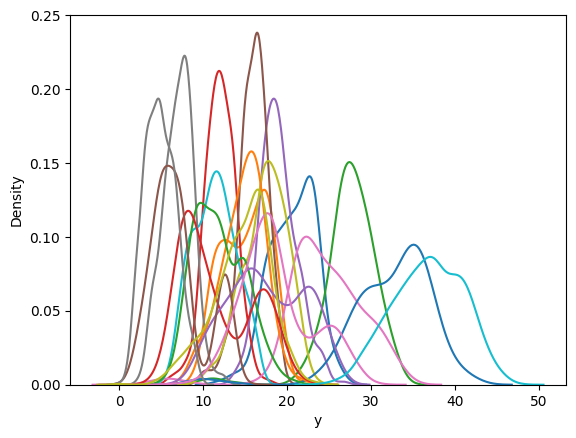

In [353]:
# for i in range(0, len(cell_names)-1):
#     cell_1_data = df[df['cell_name']==cell_names[i]]
#     cell_2_data = df[df['cell_name']==cell_names[i+1]]
    
    # plot = sns.histplot(cell_1_data.y, kde=True, ax=axs[0], color='cyan')
    # plot = sns.histplot(cell_2_data.y, kde=True, ax=axs[0], color='teal')

for cell_name in cell_names:

    sns.kdeplot(df[df['cell_name']==cell_name].y)
    
mc = MultiComparison(data=df.y, groups=df.cell_name)
print(mc.tukeyhsd())

<p>
Above, is the comparison between all possible pairs of y value distributions for a given cell_name. The reject column tells us wether or not to reject the null hypothesis for the comparison (the null hypothesis being, "Both of these distributions are alike and not significantly different!").

So, most of the "True" values in the reject column mean that most of the distributions are significantly different from each other, and can explain the variation in y. Which means, that the value of the column cell_name affects the y values.
</p>

## Step 3: Time Series Analysis

<p>
The basic statistical metrics calculated so far give a fair understanding of the data. However, we can further our understanding by treating it as a time-series (... since it IS a time series). Starting of by plotting all y values as time signals of different cells in the network. Below is a graph displaying the change in y values for each cell (different hues) over time. This plot gives us a much better understanding of the date right of the bat.
</p>

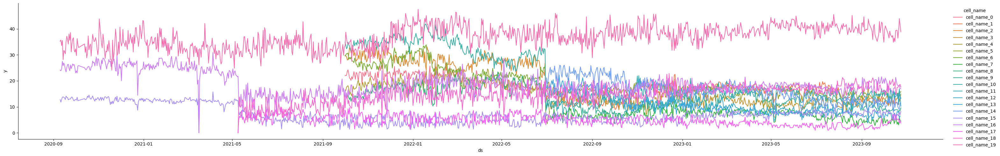

In [354]:
sns.relplot(data=df, x='ds', y='y', aspect=6, hue='cell_name', hue_order=cell_names, kind='line').set_titles('y vs DateTime for various cells')

<p>
We can further our understanding by checking for any seasonality int the signals. We will look for inter cell signal similarity and intra cell similarity. Okay, this time in english -> We will try to see if a given cell signal has periodic patterns or not, AND we will try to see if two or more cells share this periodic pattern or not.

We can do both of these things if we plot y vs ds for monthly and weekly durations. However, with the limited scope of this assignment, I will limit myself to just the month duration.
</p> 

### 3.1 Comparison to White Noise and Random Walk

In [355]:
for cell_name in cell_names:
    cell_data = df[df['cell_name']==cell_name]

    # White noise generated for mean and std of the y distribution
    df.wn = np.random.normal(loc=cell_data.y.mean(), scale=cell_data.y.std(), size=len(cell_data))

    # Random walk generated for mean and std of the y distribution
    df.rw = np.random.normal(loc=cell_data.y.mean(), scale=cell_data.y.std(), size=len(cell_data))

    # Stationarity
    stationarity_y = adfuller(df.y)
    stationarity_wn = adfuller(df.wn)
    stationarity_rw = adfuller(df.rw)

    print(f'\n\n ########################################### Cell Name: {cell_name} ###########################################\n \
        \t\t\tStationarity for: \n \
        1. y Values ----------------------------------\n\
            {stationarity_y} \n\
        2. White Noise -------------------------------\n\
            {stationarity_wn} \n\
        3. Random Walk -------------------------------\n\
            {stationarity_rw} \n\
        ')



 ########################################### Cell Name: cell_name_0 ###########################################
         			Stationarity for: 
         1. y Values ----------------------------------
            (-3.021534549921802, 0.03293169902521984, 39, 11132, {'1%': -3.430937568141047, '5%': -2.861799673074745, '10%': -2.5669082188587504}, 49323.739291417776) 
        2. White Noise -------------------------------
            (-16.264321297110214, 3.5398203831181286e-29, 0, 275, {'1%': -3.454355055831705, '5%': -2.8721080938842976, '10%': -2.572401325619835}, 1245.9856232337947) 
        3. Random Walk -------------------------------
            (-17.079124919811264, 7.729055740953429e-30, 0, 275, {'1%': -3.454355055831705, '5%': -2.8721080938842976, '10%': -2.572401325619835}, 1250.0971034861464) 
        


 ########################################### Cell Name: cell_name_1 ###########################################
         			Stationarity for: 
         1. y Values ---------

<p>
The low p values in the Dickey Fuller test suggest that we can say with confidence that:
</br>
Because the t test statistics is smaller than the critical values, the distributions of all y values are very stationary. This means that the y values are not that heavily dependant on time.
</p>

### 3.2 Seasonality

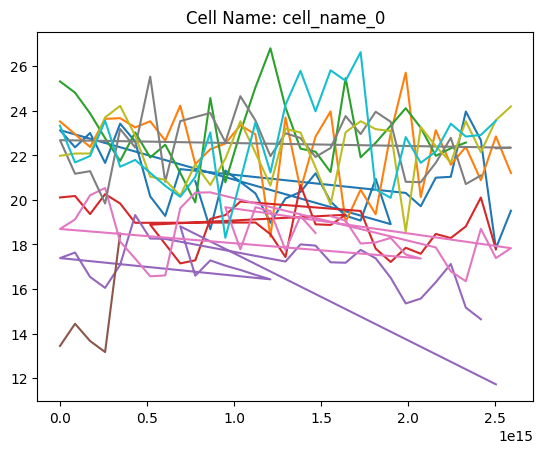

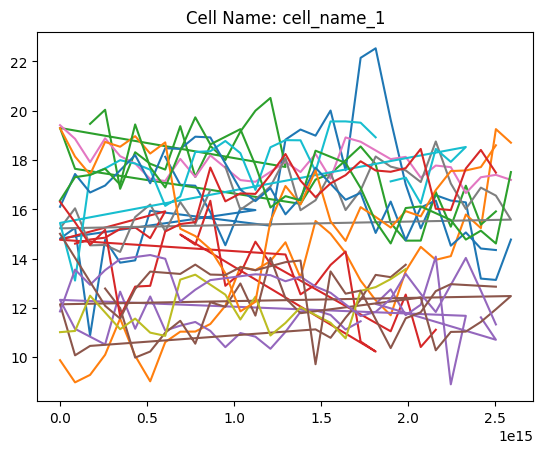

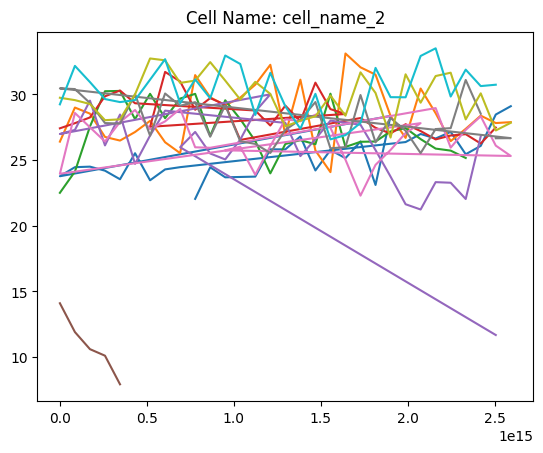

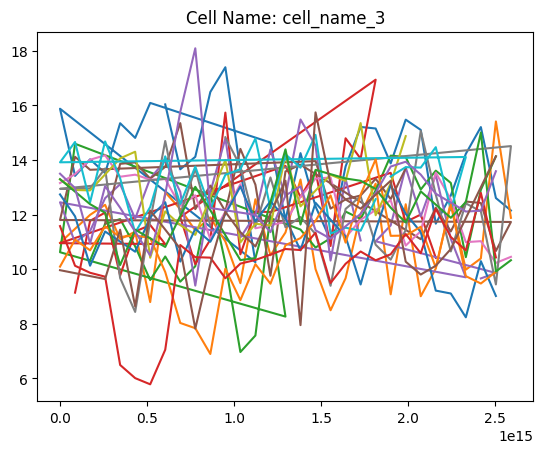

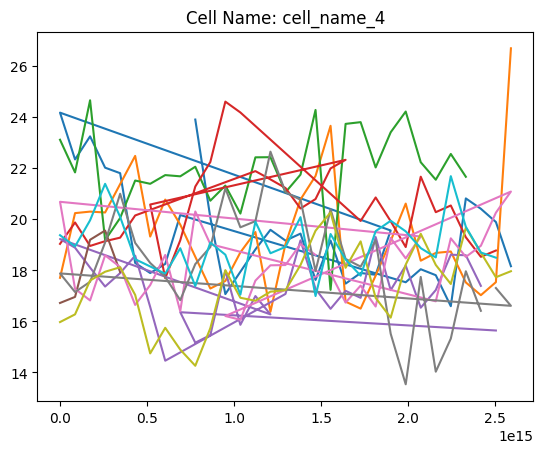

...

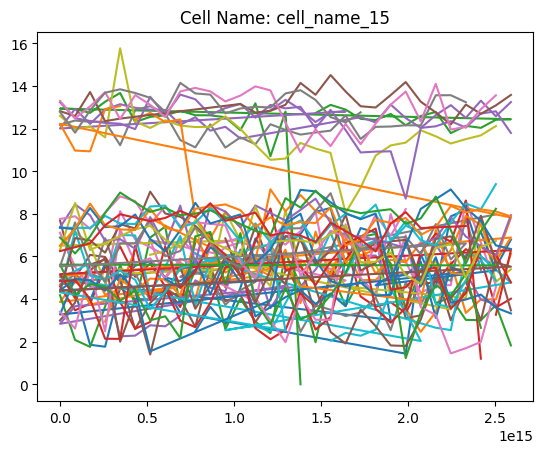

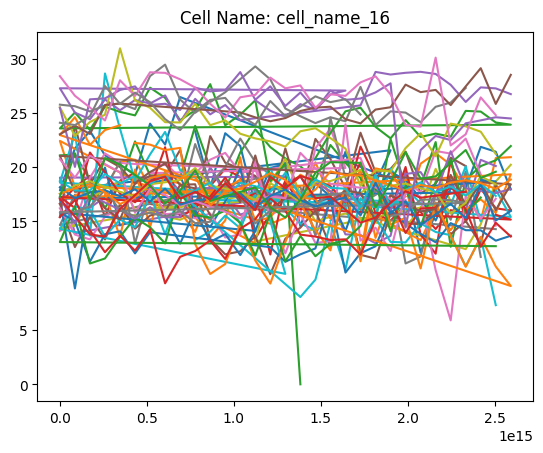

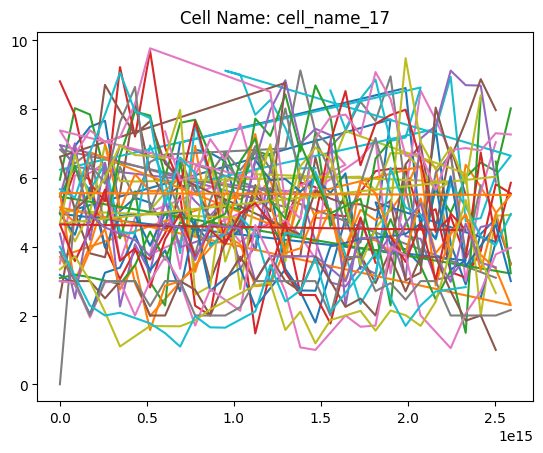

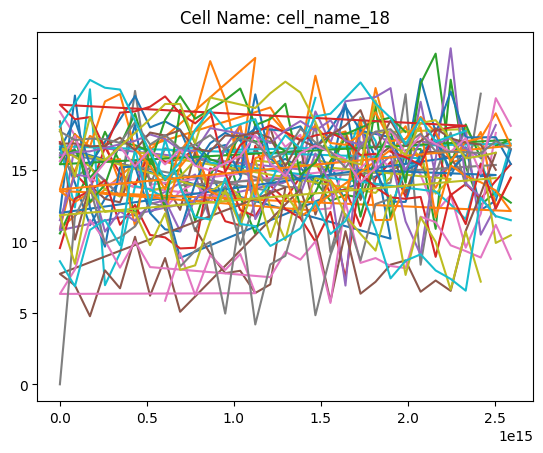

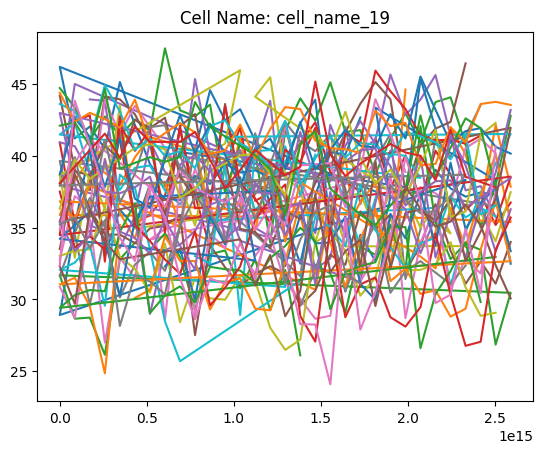

In [356]:
df['day'] = df.ds.dt.day
df['month'] = df.ds.dt.month
df['year'] = df.ds.dt.year

# unique_year_month = df.groupby(['year', 'month'])
months = df.month.unique()
years = df.year.unique()

for cell_name in cell_names:
    cell_data = df[df['cell_name']==cell_name]


    # print(cell_data.head())
    # print(cell_data.tail())

    for year in years:
        year_data = cell_data[cell_data['year']==year]

        # print(year_data.head())
        # print(year_data.tail())

        for month in months:
            month_data = year_data[year_data['month']==month]
            
            if not month_data.empty:
                # print(month_data.head())
                # print(month_data.tail())
                x_axis_values = month_data.ds - month_data.ds.min()
                plt.plot(x_axis_values, month_data.y) #, label=str(month_data['cell_name'] + ' ' + month_data['month'] + '_' + month_data['year']))
    plt.title(f'Cell Name: {cell_name}')
    plt.show()

<p> Visual Analysis of the y value series for each cell tells us that the time series has not interesting seasonality</p>

### 3.3 Decomposing the time-series

############################################### Decomposed Signal of Cell_name: cell_name_0 ###############################################


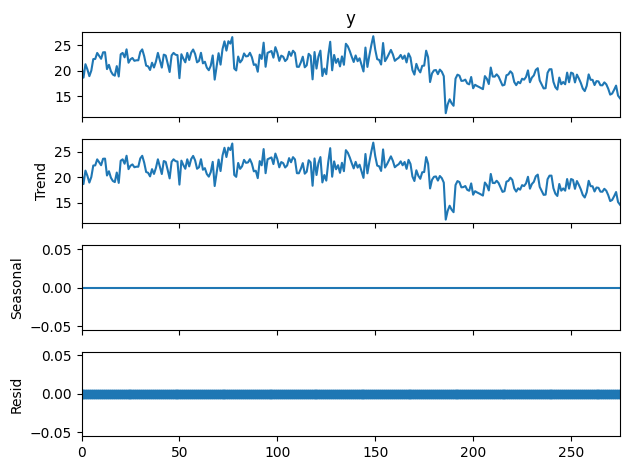

############################################### Decomposed Signal of Cell_name: cell_name_1 ###############################################


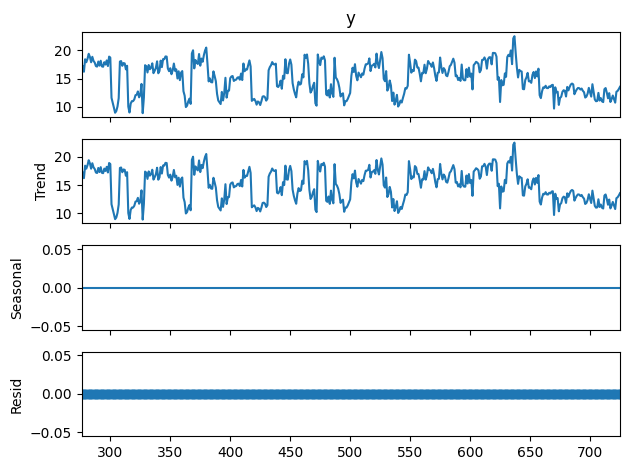

############################################### Decomposed Signal of Cell_name: cell_name_2 ###############################################


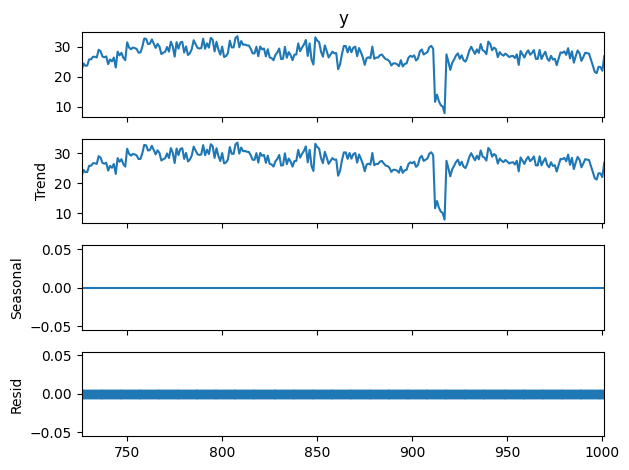

############################################### Decomposed Signal of Cell_name: cell_name_3 ###############################################


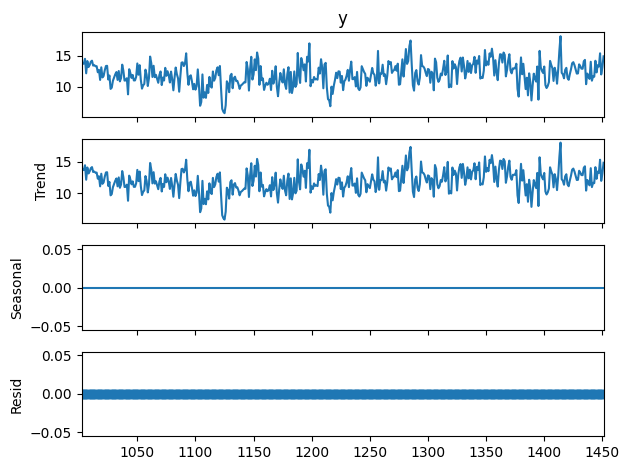

############################################### Decomposed Signal of Cell_name: cell_name_4 ###############################################


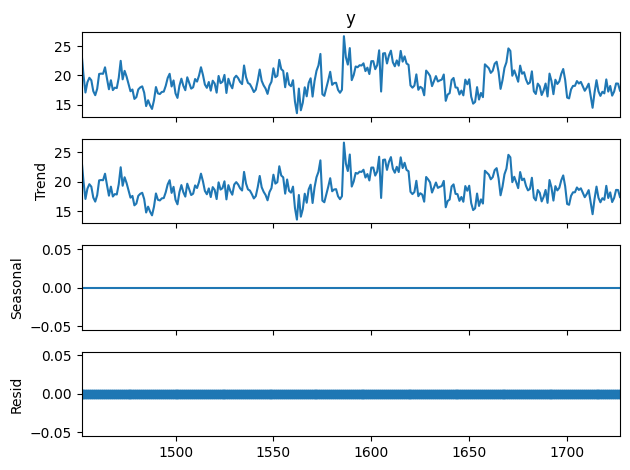

############################################### Decomposed Signal of Cell_name: cell_name_5 ###############################################


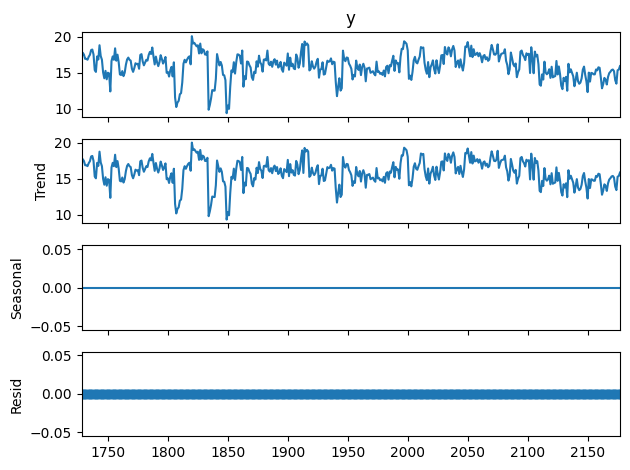

############################################### Decomposed Signal of Cell_name: cell_name_6 ###############################################


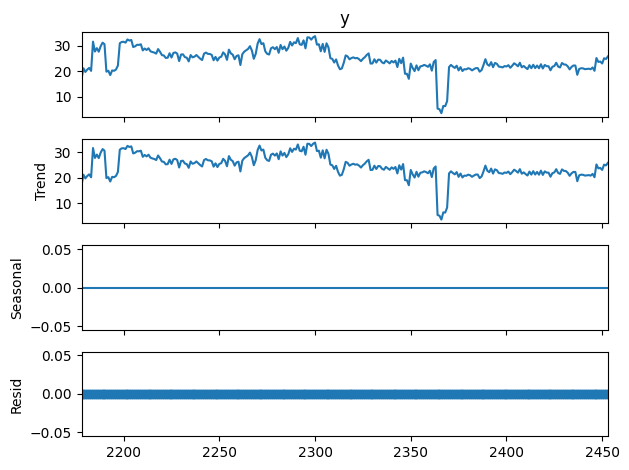

############################################### Decomposed Signal of Cell_name: cell_name_7 ###############################################


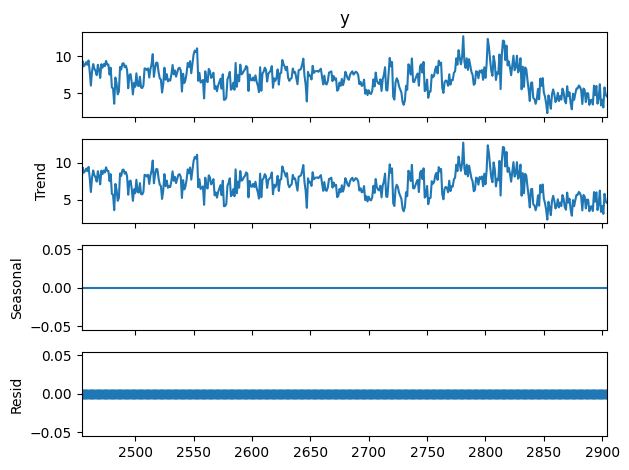

############################################### Decomposed Signal of Cell_name: cell_name_8 ###############################################


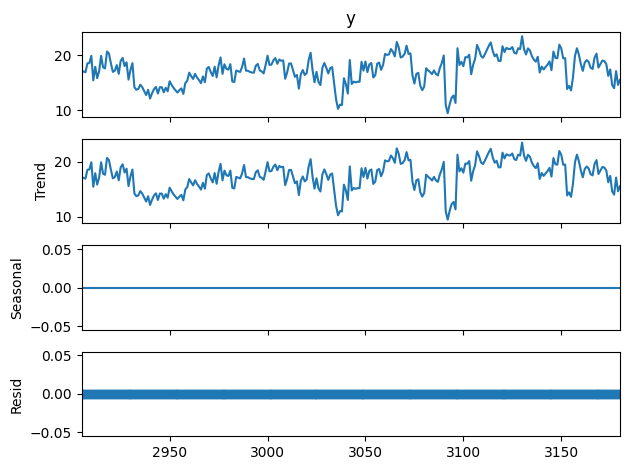

############################################### Decomposed Signal of Cell_name: cell_name_9 ###############################################


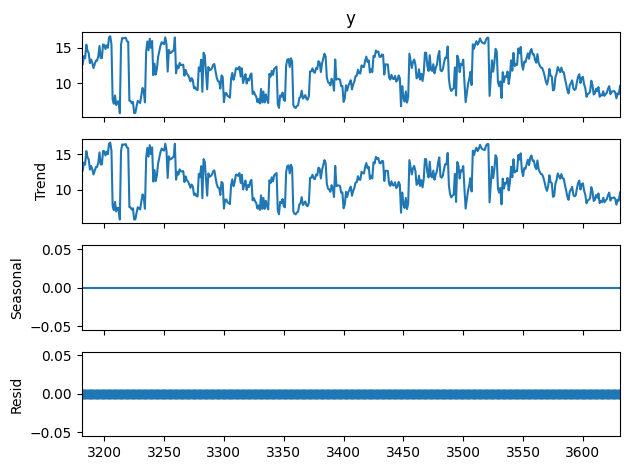

############################################### Decomposed Signal of Cell_name: cell_name_10 ###############################################


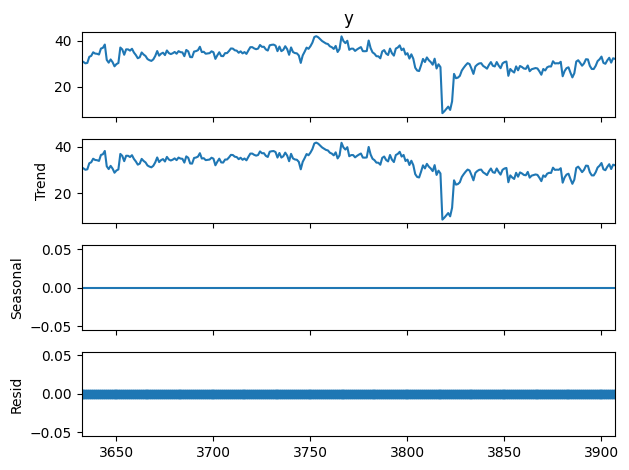

############################################### Decomposed Signal of Cell_name: cell_name_11 ###############################################


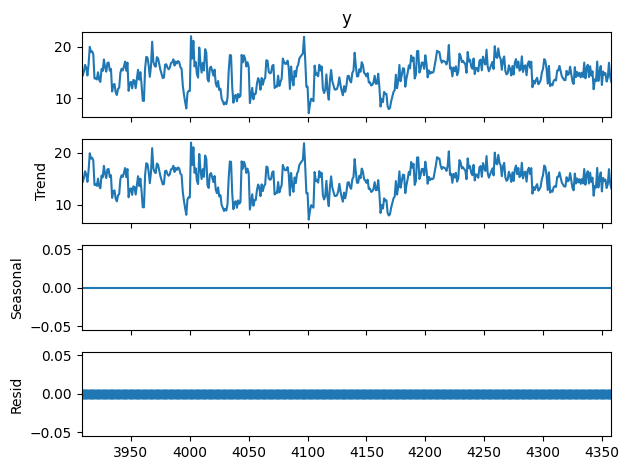

############################################### Decomposed Signal of Cell_name: cell_name_12 ###############################################


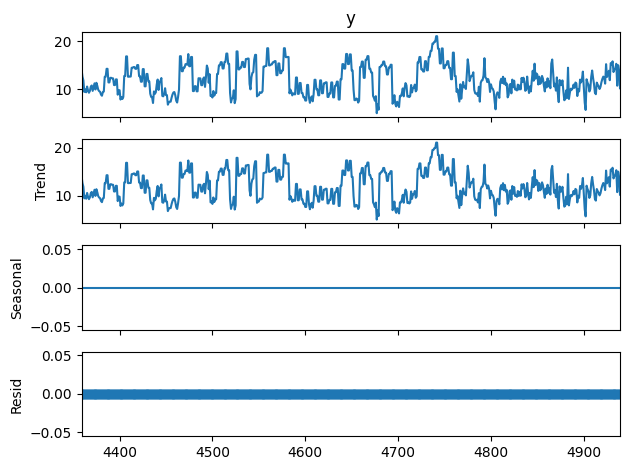

############################################### Decomposed Signal of Cell_name: cell_name_13 ###############################################


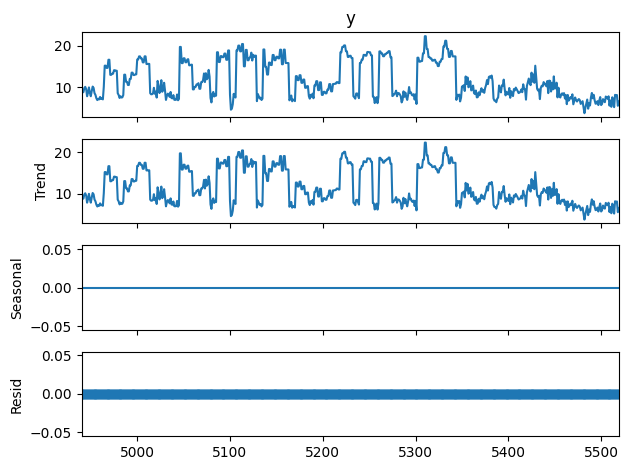

############################################### Decomposed Signal of Cell_name: cell_name_14 ###############################################


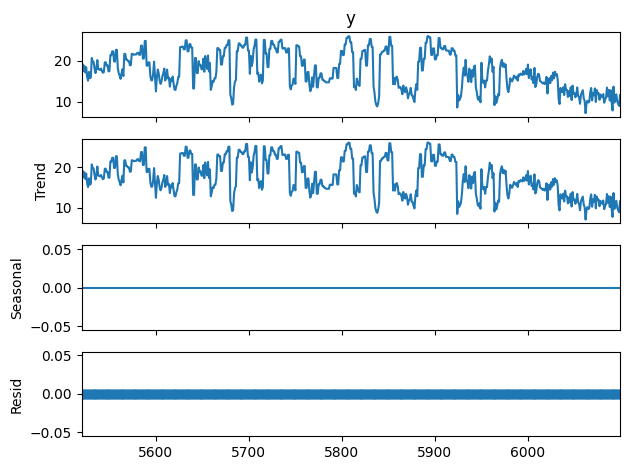

############################################### Decomposed Signal of Cell_name: cell_name_15 ###############################################


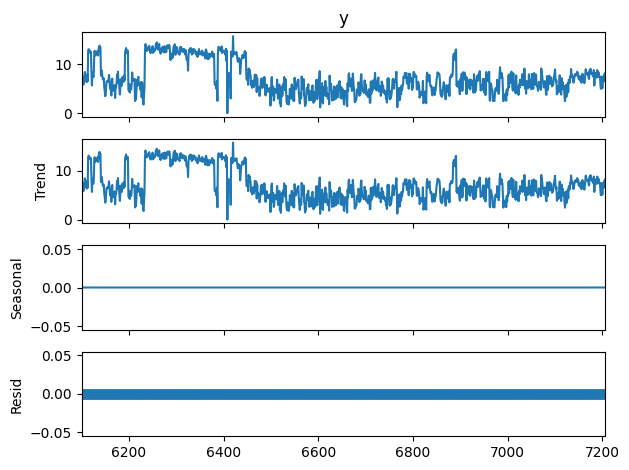

############################################### Decomposed Signal of Cell_name: cell_name_16 ###############################################


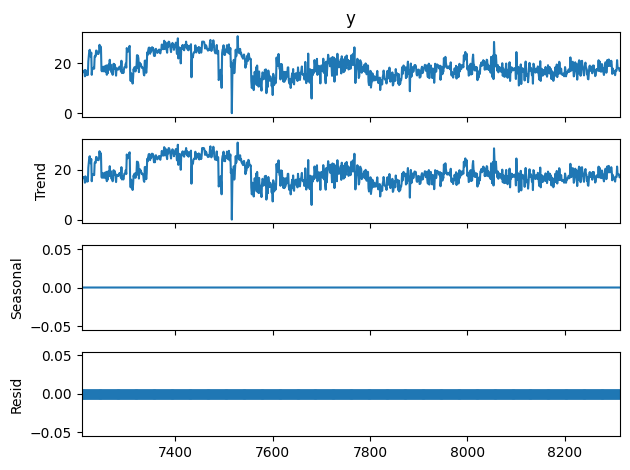

############################################### Decomposed Signal of Cell_name: cell_name_17 ###############################################


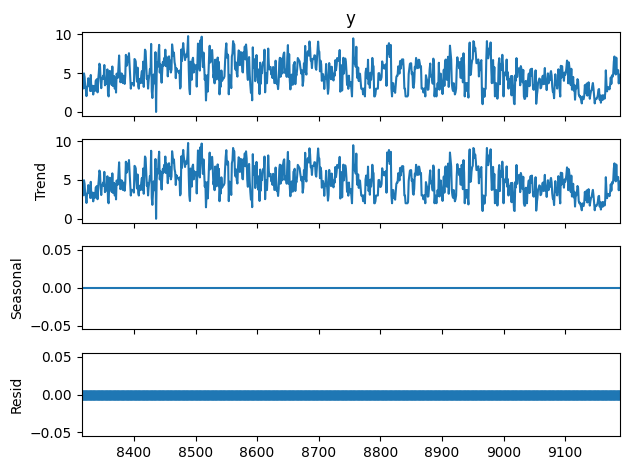

############################################### Decomposed Signal of Cell_name: cell_name_18 ###############################################


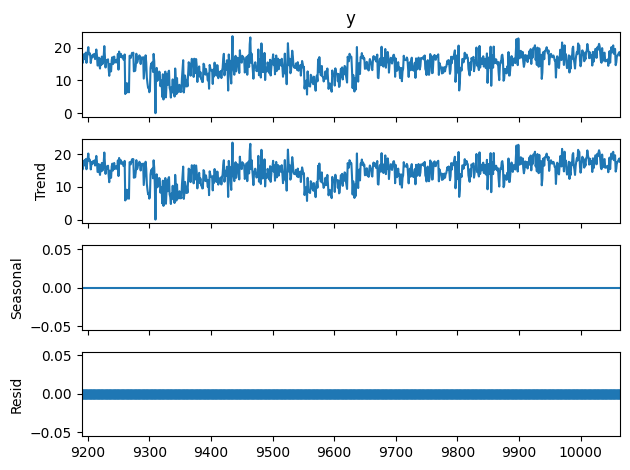

############################################### Decomposed Signal of Cell_name: cell_name_19 ###############################################


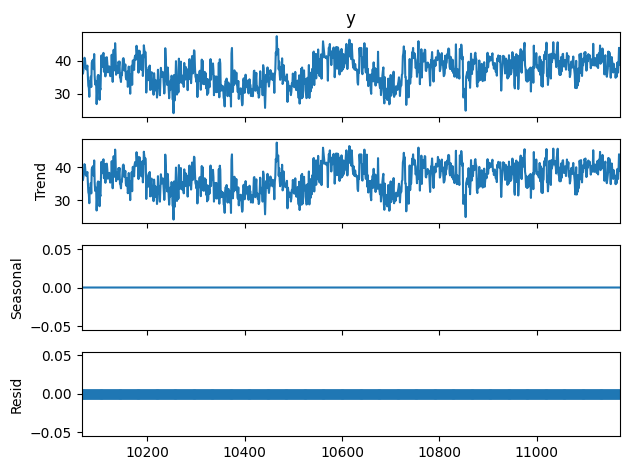

In [357]:
for cell_name in cell_names:
    cell_data = df[df['cell_name']==cell_name]

    try:
        decomped_ts = seasonal_decompose(cell_data.y, period=1)
        
        print(f'############################################### Decomposed Signal of Cell_name: {cell_name} ###############################################')
        decomped_ts.plot()
        plt.show()
        
    except ValueError:
        continue

<p>
The decomposition of the signal into the effects of Trend, Seasonality, and Residual confirms the high stationarity and low seasonal characteristics of the y value series for all the cells.

In fact, most of the behaviour of the series can be explained as a trend for all the cell's y value series.
</p>

### 3.3 Autocorrelation

############################################### Decomposed Signal of Cell_name: cell_name_0 ###############################################


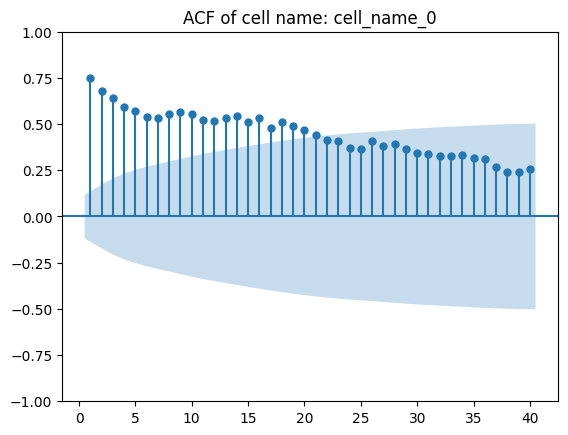

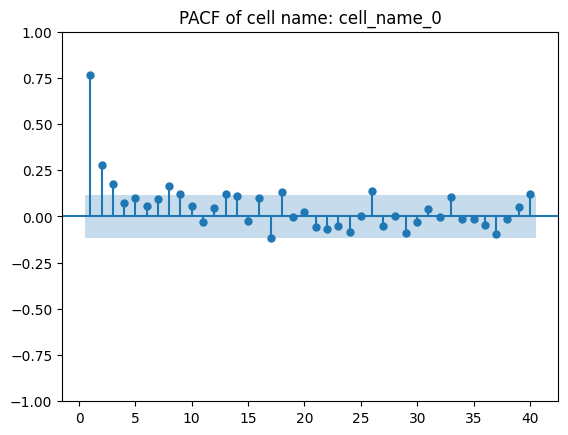

############################################### Decomposed Signal of Cell_name: cell_name_1 ###############################################


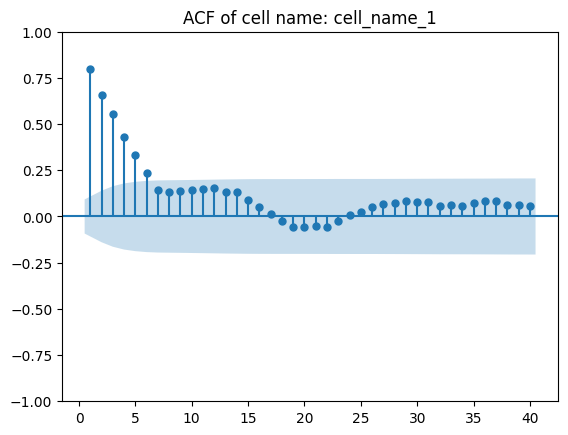

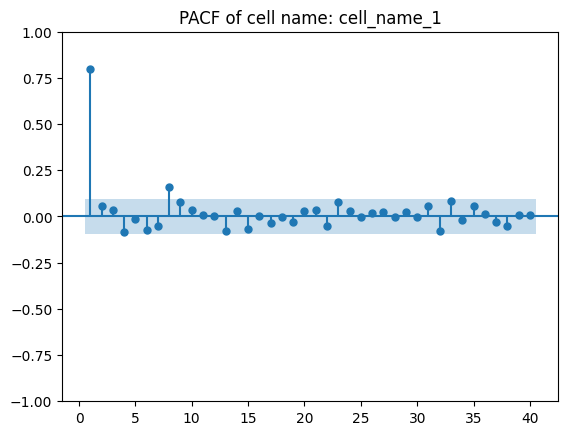

############################################### Decomposed Signal of Cell_name: cell_name_2 ###############################################


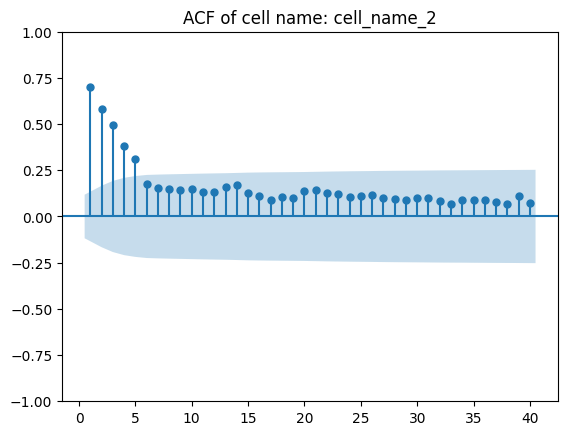

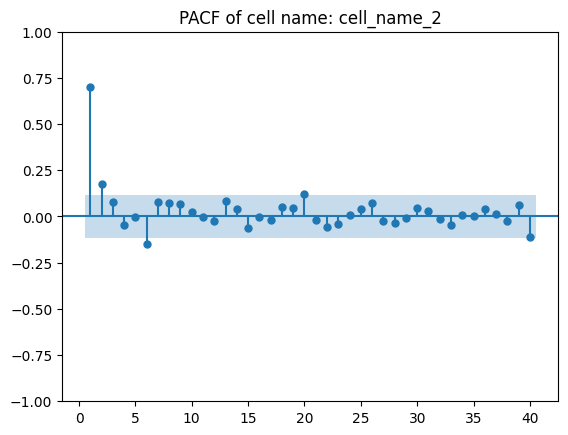

############################################### Decomposed Signal of Cell_name: cell_name_3 ###############################################


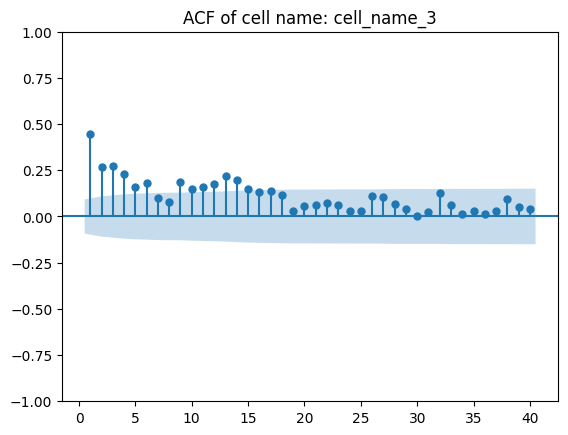

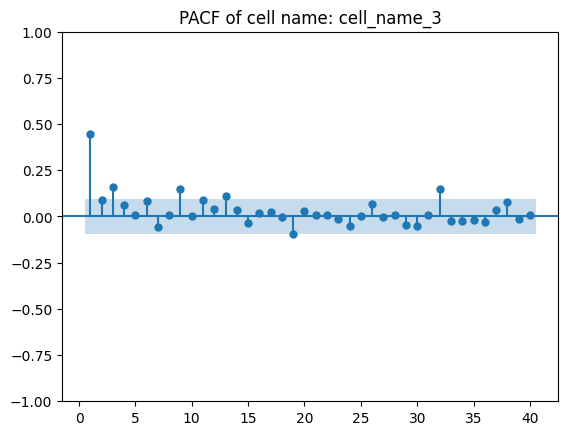

############################################### Decomposed Signal of Cell_name: cell_name_4 ###############################################


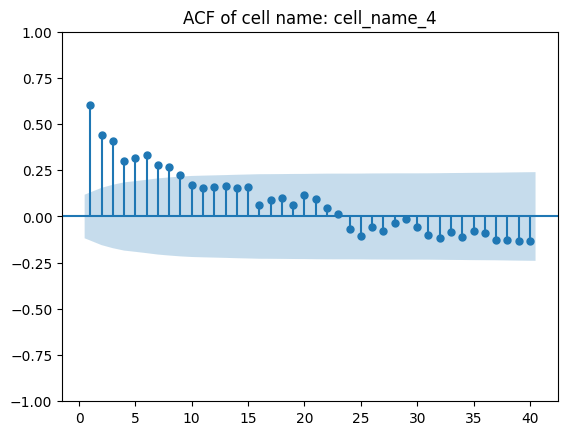

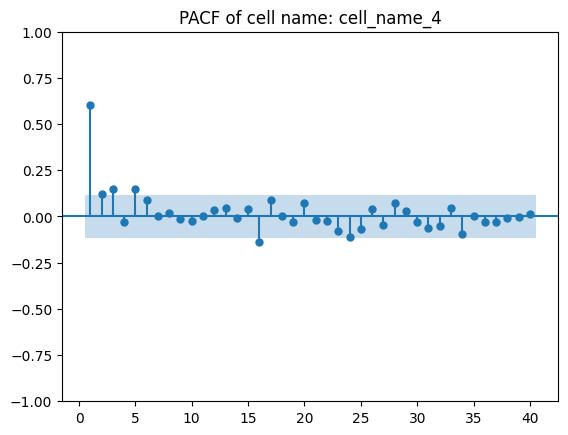

############################################### Decomposed Signal of Cell_name: cell_name_5 ###############################################


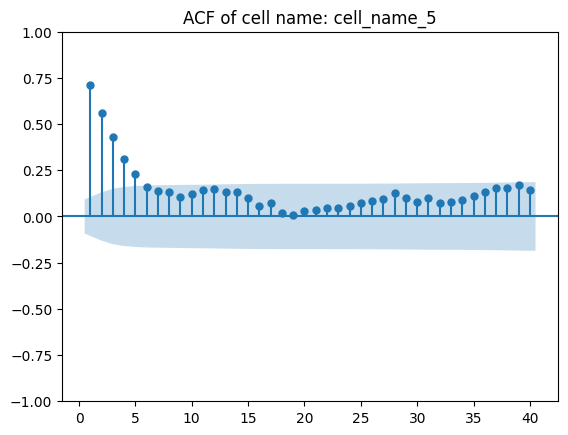

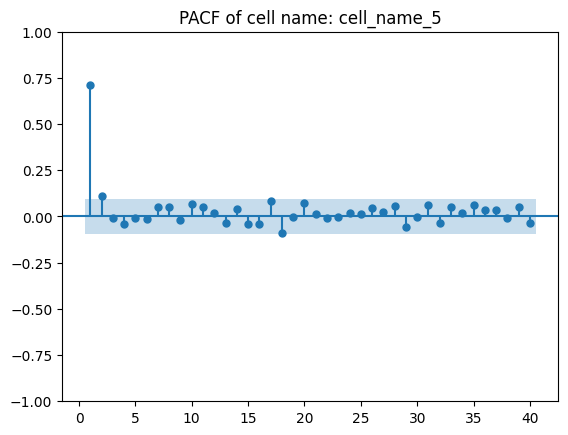

############################################### Decomposed Signal of Cell_name: cell_name_6 ###############################################


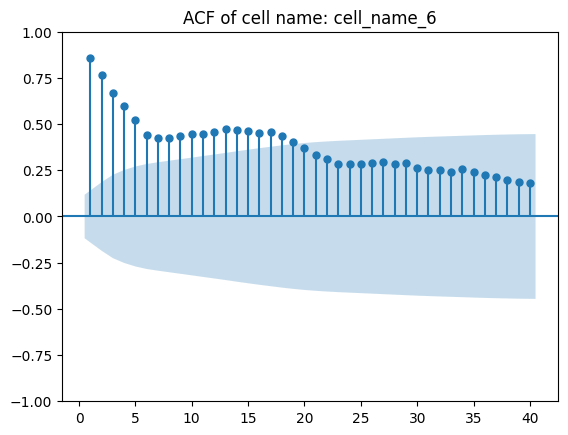

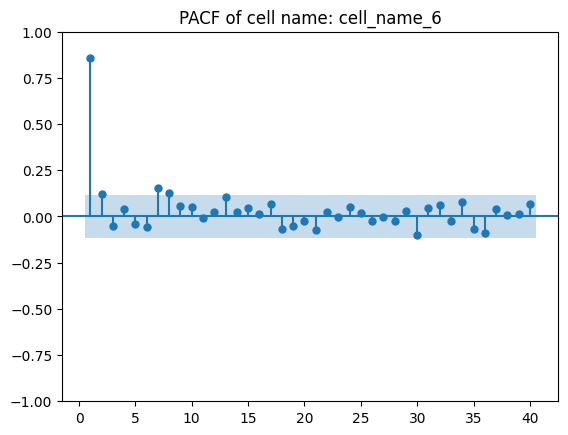

############################################### Decomposed Signal of Cell_name: cell_name_7 ###############################################


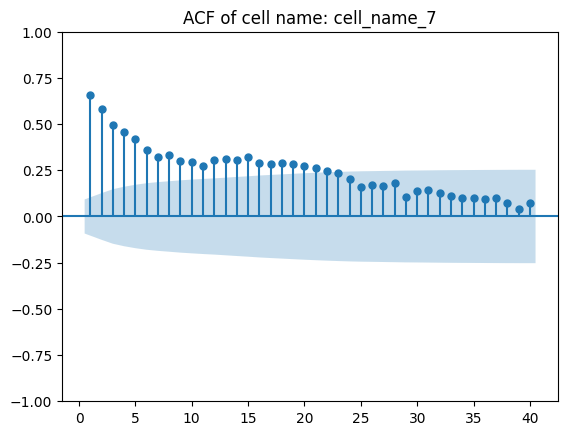

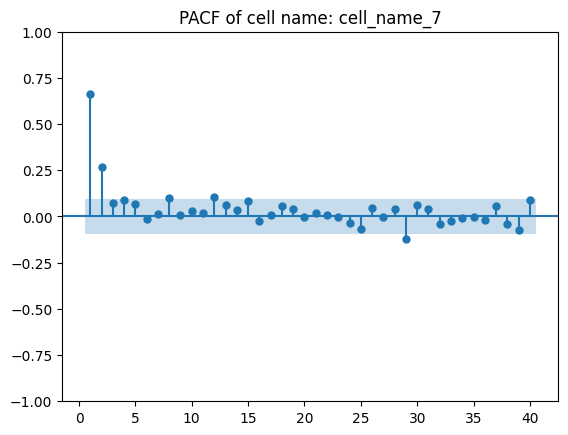

############################################### Decomposed Signal of Cell_name: cell_name_8 ###############################################


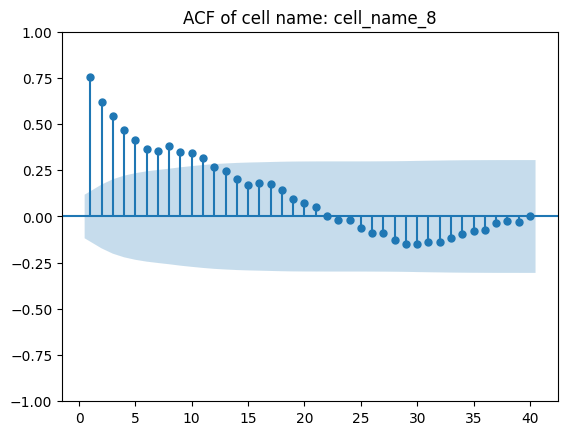

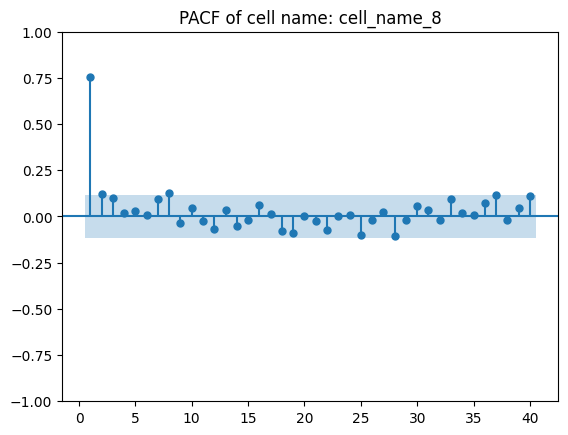

############################################### Decomposed Signal of Cell_name: cell_name_9 ###############################################


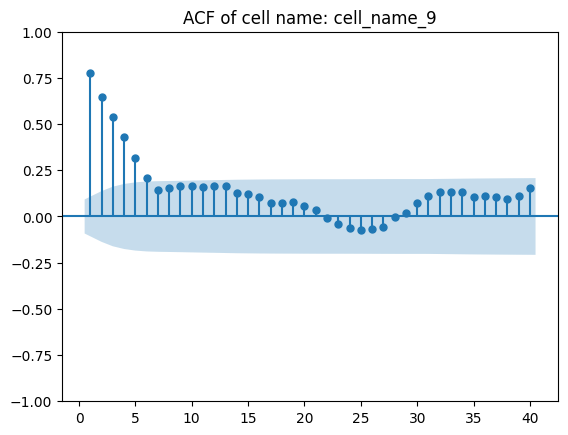

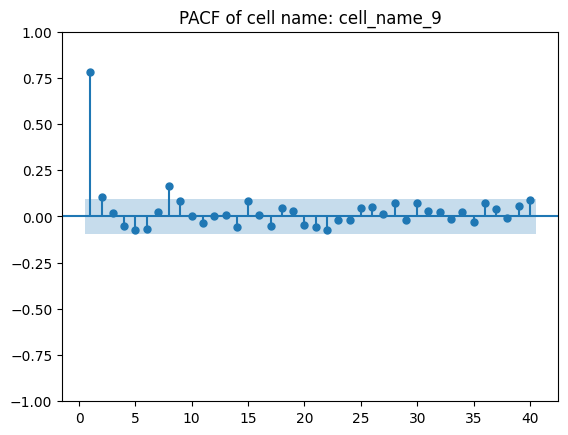

############################################### Decomposed Signal of Cell_name: cell_name_10 ###############################################


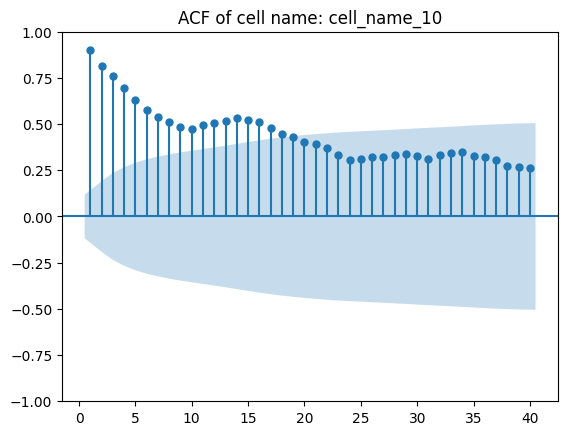

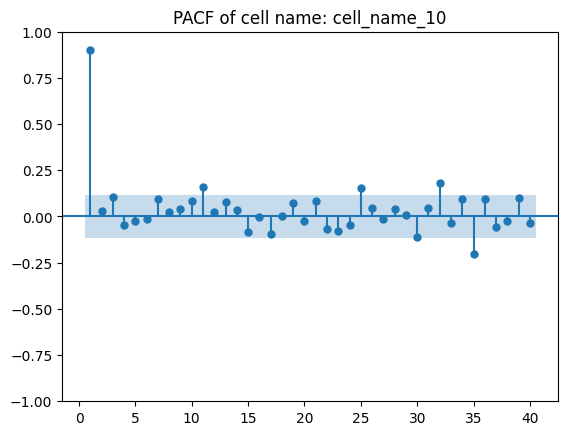

############################################### Decomposed Signal of Cell_name: cell_name_11 ###############################################


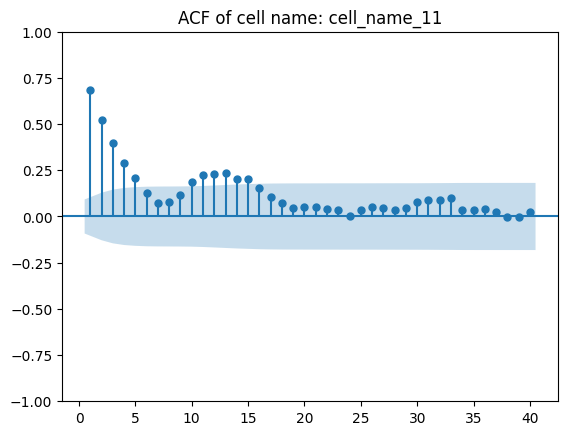

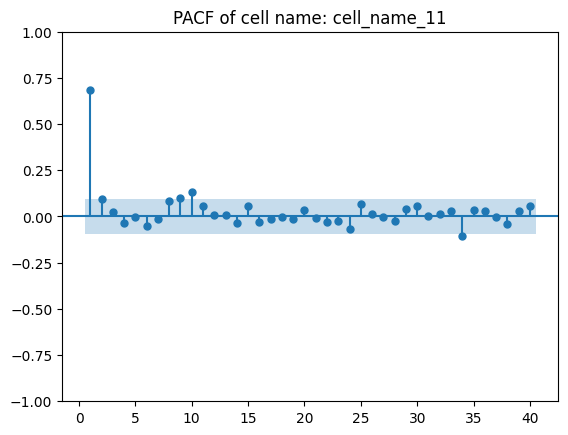

############################################### Decomposed Signal of Cell_name: cell_name_12 ###############################################


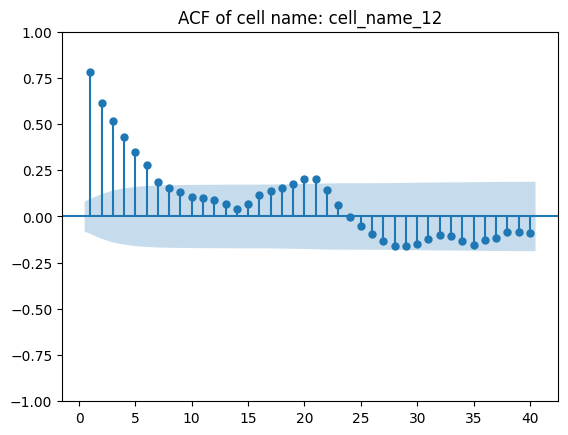

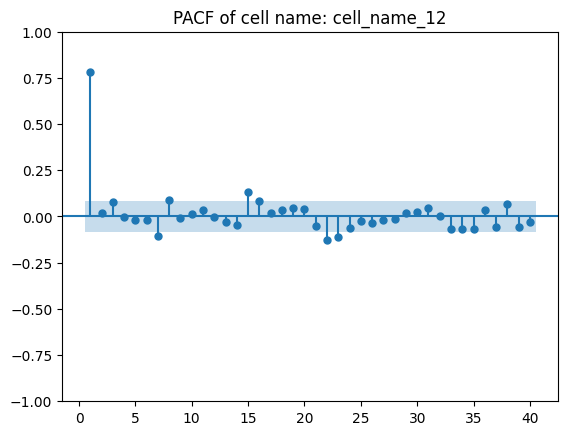

############################################### Decomposed Signal of Cell_name: cell_name_13 ###############################################


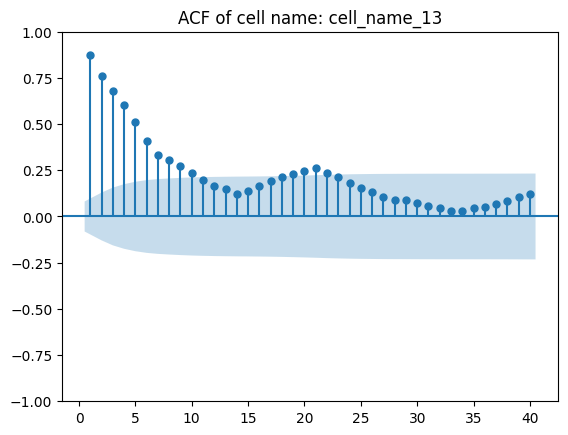

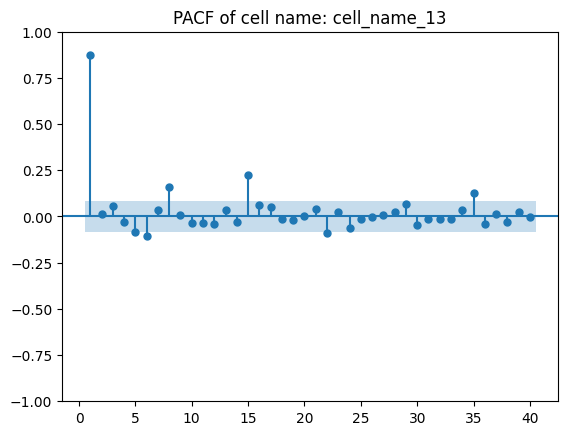

############################################### Decomposed Signal of Cell_name: cell_name_14 ###############################################


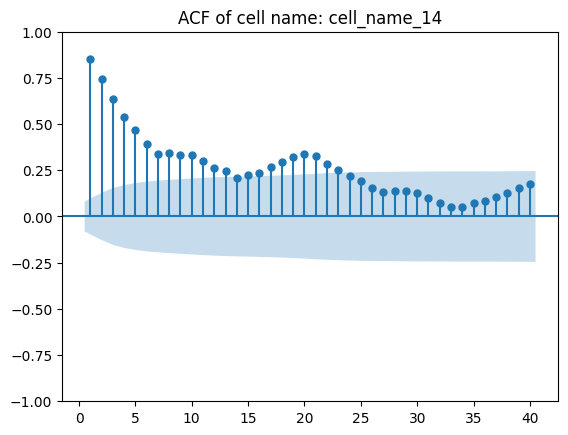

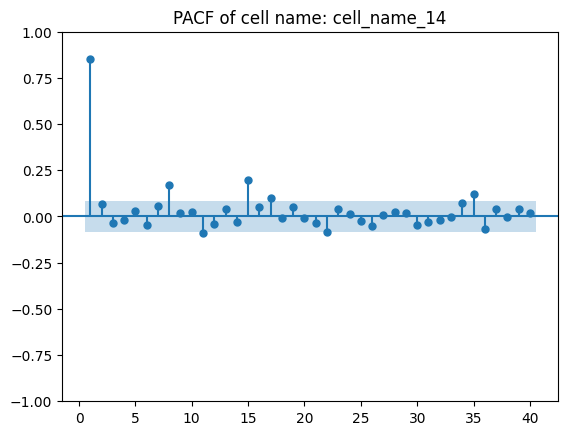

############################################### Decomposed Signal of Cell_name: cell_name_15 ###############################################


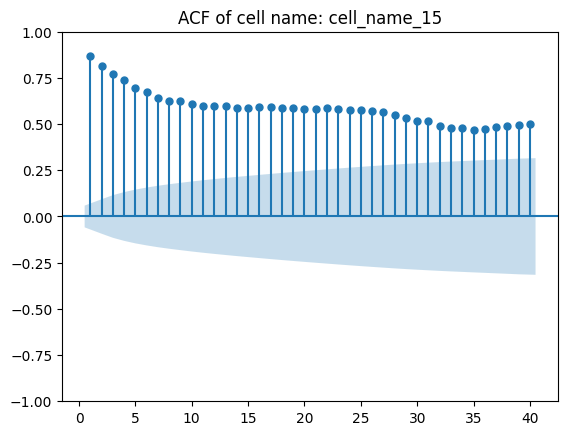

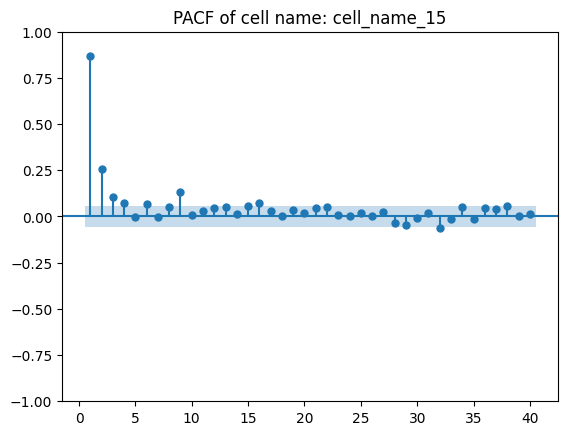

############################################### Decomposed Signal of Cell_name: cell_name_16 ###############################################


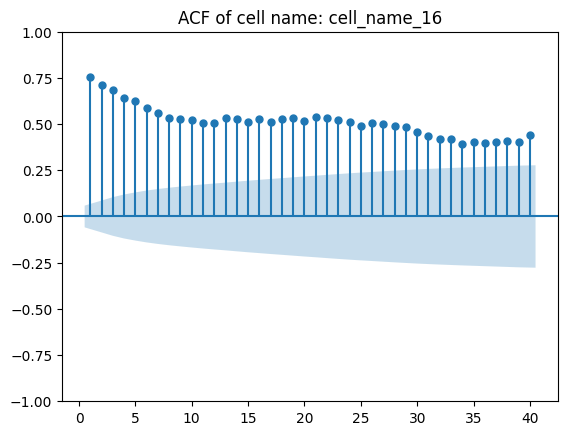

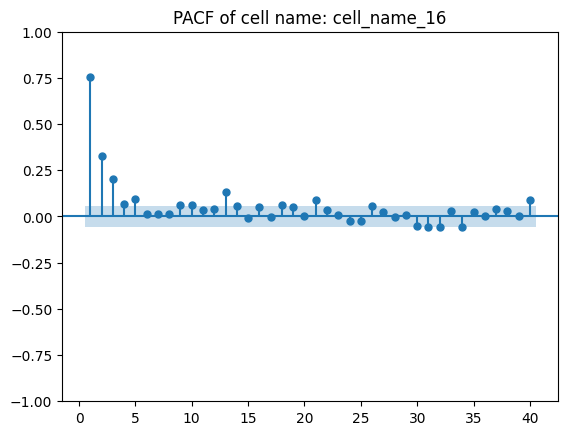

############################################### Decomposed Signal of Cell_name: cell_name_17 ###############################################


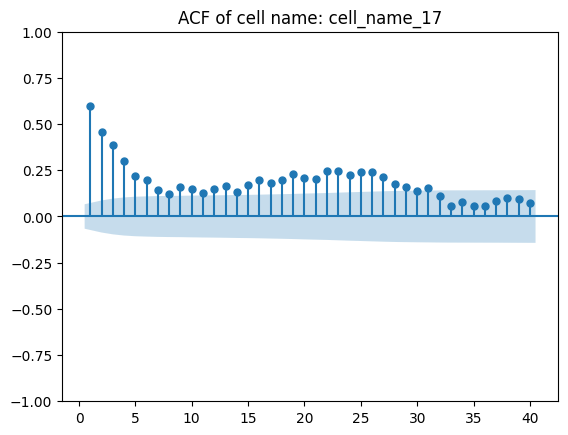

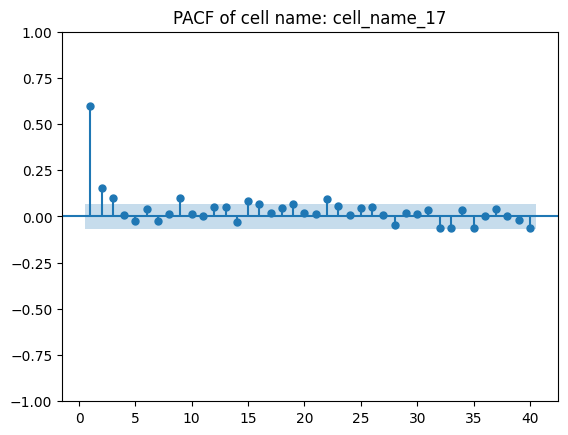

############################################### Decomposed Signal of Cell_name: cell_name_18 ###############################################


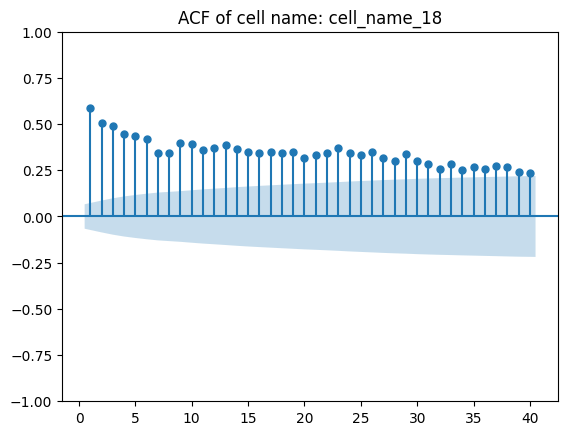

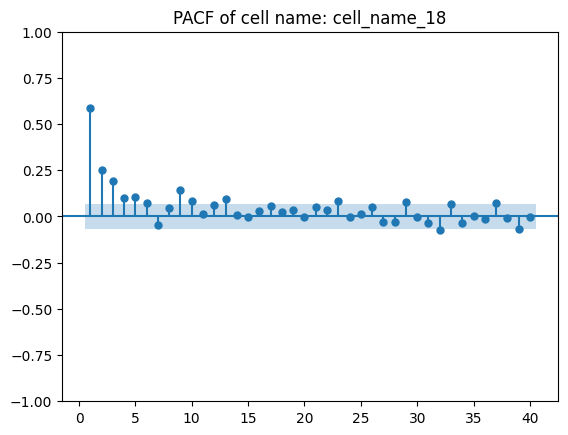

############################################### Decomposed Signal of Cell_name: cell_name_19 ###############################################


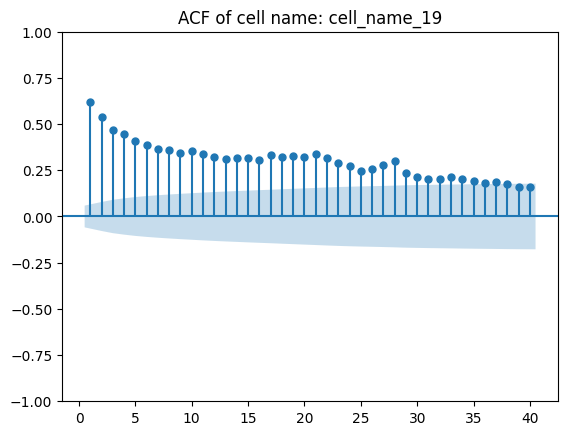

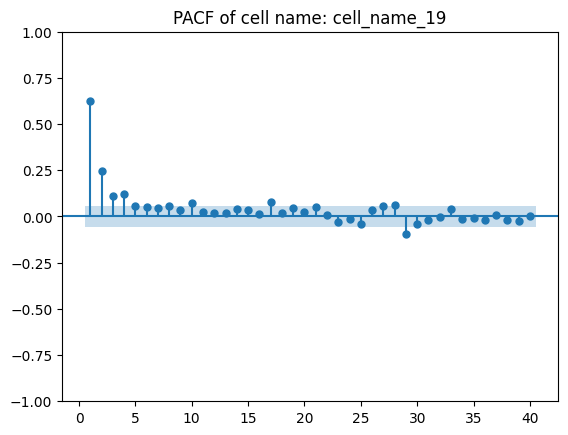

In [358]:
for cell_name in cell_names:
    cell_data = df[df['cell_name']==cell_name]

    try:
        decomped_ts = seasonal_decompose(cell_data.y, period=1)
        
        print(f'############################################### Decomposed Signal of Cell_name: {cell_name} ###############################################')
        sm.graphics.tsa.plot_acf(cell_data.y, lags=40, zero=False)
        plt.title(f'ACF of cell name: {cell_name}')
        plt.show()
        sm.graphics.tsa.plot_pacf(cell_data.y, lags=40, zero=False, method=('ols'))
        plt.title(f'PACF of cell name: {cell_name}')
        plt.show()
        
    except ValueError:
        continue

<p> Auto-correlation is insignificant for most of the lags for all cell y values. This implies that the signal does not have many temporal patterns within them.</p>

## Step 4: Modelling

<p>
In section 2.2, we saw that the cell_name itself can explain the difference in y values very well. Additionally, we saw that each cell's y value series has a different trends in the decomposed signals (section 3.3). Both of these point to the fact that the signal for each cell should be modelled separately.

Furthermore, the stationary and non-seasonal nature of the trends suggest that an Auto Regressor model will be able to approximate the relation of y values and time fairly well.
</p>

### 4.1 Data preprocessing 

In [359]:
from dateutil.relativedelta import relativedelta 

low_data_cell_names = []

def train_test_split(cell_data, cell_name):

    min_time_stamp = cell_data.ds.min()
    max_time_stamp = cell_data.ds.max()

    # Normalizing around the mean
    mean_y = cell_data.y.mean()
    cell_data['norm_y'] = cell_data.y.div(mean_y)*100
    
    # Using a 80:20 split for signals that are shorter than 1 year
    if (max_time_stamp - min_time_stamp) < np.timedelta64(365, 'D'):
        # print(f'Cell Name {cell_name} has a y signal shorter than a year, defaulting to 80:20 split')

        train_cut_off = int(len(cell_data)*0.8)
        train_cell_data = cell_data[:train_cut_off]
        test_cell_data = cell_data[train_cut_off:]
    
    # Otherwise the forecasting will be done after a year
    else:
        train_cut_off = min_time_stamp + relativedelta(years=1)

        train_cell_data = cell_data[cell_data['ds'] <= train_cut_off]
        test_cell_data = cell_data[cell_data['ds'] > train_cut_off]

    return train_cell_data, test_cell_data


<p>
The PCAF graph shows that the autocorrelation with a lag of 8 is significant, so we can use that for the modelling. We can find the best model by repeadely checking for low Log Likelihood values and high Coef significance (p value) and low information criteria (amount of information required to make accurate predictions with a given model).
</p>

### 4.2 Manual Tuning of the Model

In [360]:
# Modelling for Cell_Name_0
cell_data = df[df['cell_name']==cell_names[0]]

train_cell_data, test_cell_data = train_test_split(cell_data, cell_name)

# Training the model

model_ar = AutoReg(train_cell_data.norm_y, lags=8)
results_ar = model_ar.fit()
print(results_ar.summary())

                            AutoReg Model Results                             
Dep. Variable:                 norm_y   No. Observations:                  220
Model:                     AutoReg(8)   Log Likelihood                -746.780
Method:               Conditional MLE   S.D. of innovations              8.196
Date:                Mon, 30 Oct 2023   AIC                           1513.561
Time:                        06:51:54   BIC                           1547.127
Sample:                             8   HQIC                          1527.127
                                  220                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.3089      6.428      2.071      0.038       0.711      25.907
norm_y.L1      0.4289      0.068      6.339      0.000       0.296       0.562
norm_y.L2      0.1715      0.074      2.328      0.0

<p>
We can also monitor the Residuals. If they resemble white noise, it is an indicator of the correct modelling of the data
</p>

In [361]:
cell_data['res'] = results_ar.resid
print(f'Mean: {cell_data.res.mean()}')
print(f'Variance: {cell_data.res.var()}')


Mean: 1.4184041781777095e-13
Variance: 67.48795981951345


<p>
With a lag of 8, the mean of the residuals is minimized. However, the mean not being zero indicatess that there is some additional information that we are not modelling. Incorporating Moving Averages to the model as well to make the predictions more robust and less sensitive to the immediate last ovservation.
</p>

<p>
I started with an initial order of (8,0,5) due to the high correlation between the original y values of cell_name_0 and a lagged version of it (calculated in section 3.3 acf and pacf functions). However, on experimenting the Log Likelihood is lower for (6,0,5). So, that is a better model for cell_name_0's y values. Incorporating the moving average also brings down the mean of the residuals to 0.
</p>

In [362]:
models = dict()
results = dict()

# Modelling for Cell_Name_0
cell_data = df[df['cell_name']==cell_names[0]]

train_cell_data, test_cell_data = train_test_split(cell_data, cell_name)

# Training the model
models[cell_name] = ARIMA(train_cell_data.norm_y, order=(6,0,5))
results[cell_name] = models[cell_name].fit()
print(results[cell_name].summary())

# Analyzing Residuals
cell_data['res'] = results[cell_name].resid
print(f'Mean: {cell_data.res.mean()}')
print(f'Variance: {cell_data.res.var()}')

                               SARIMAX Results                                
Dep. Variable:                 norm_y   No. Observations:                  220
Model:                 ARIMA(6, 0, 5)   Log Likelihood                -769.334
Date:                Mon, 30 Oct 2023   AIC                           1564.668
Time:                        06:51:55   BIC                           1608.786
Sample:                             0   HQIC                          1582.484
                                - 220                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        103.3785      6.686     15.462      0.000      90.274     116.483
ar.L1          0.2241      0.221      1.015      0.310      -0.209       0.657
ar.L2          0.5283      0.176      2.994      0.0

<p>
Similarly the modeling for all cells can be optimized...
</p>

In [363]:
# Modelling for Cell_Name_1
cell_data = df[df['cell_name']==cell_names[1]]

train_cell_data, test_cell_data = train_test_split(cell_data, cell_name)

# Training the model
models[cell_name] = ARIMA(train_cell_data.norm_y, order=(7,0,6))
results[cell_name] = models[cell_name].fit()
# print(results[cell_name].summary())

# Analyzing Residuals
cell_data['res'] = results[cell_name].resid
# print(f'Mean: {cell_data.res.mean()}')
# print(f'Variance: {cell_data.res.var()}')

## 4.3 Automatic Tuning of the model and Predictions

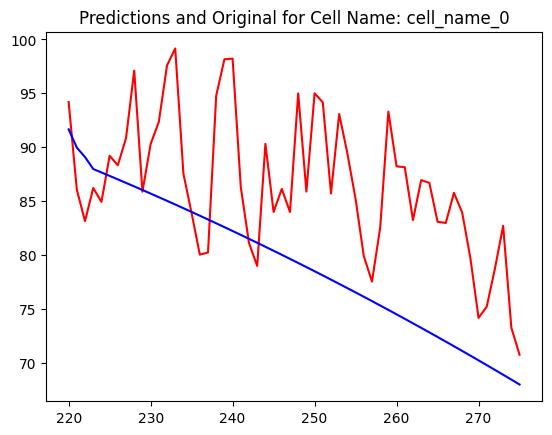

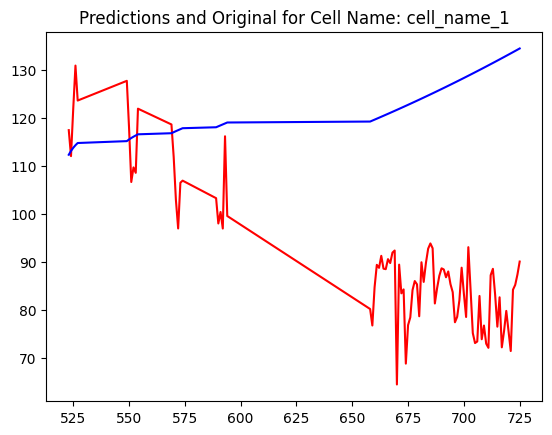

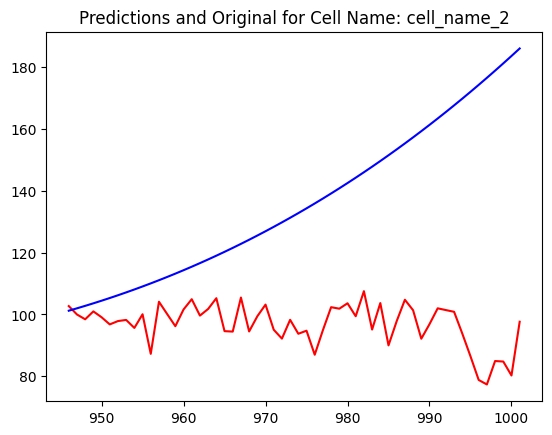

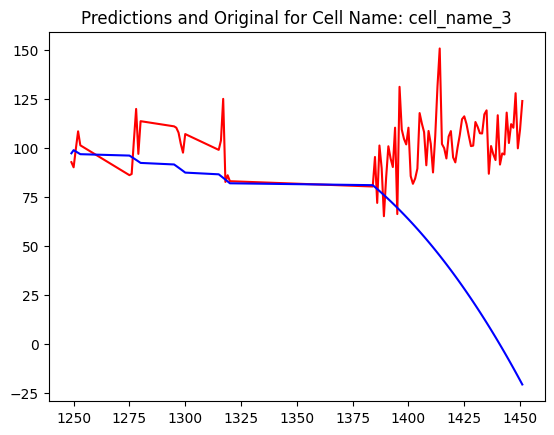

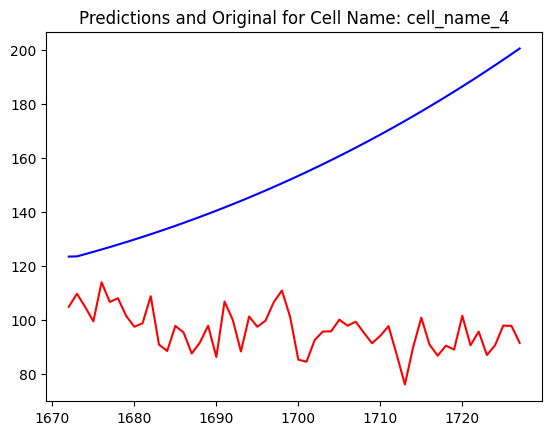

...

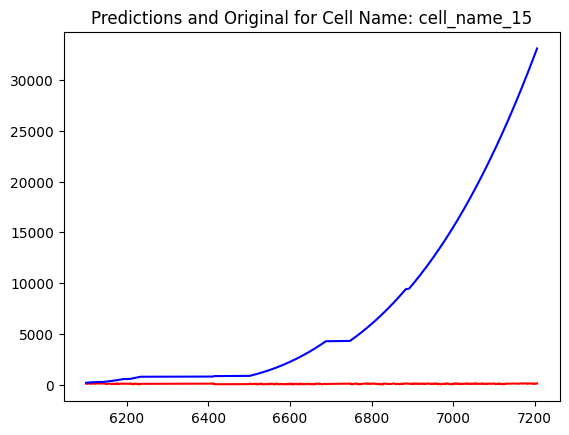

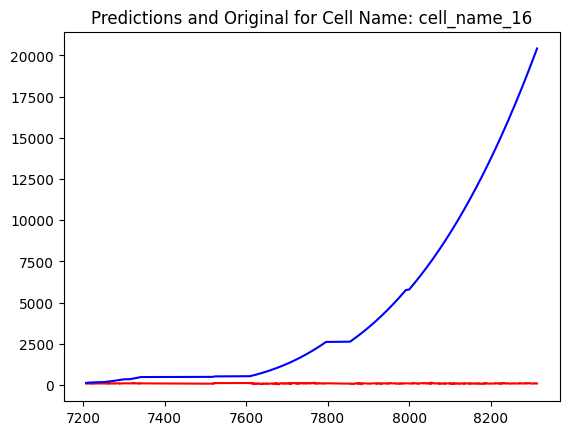

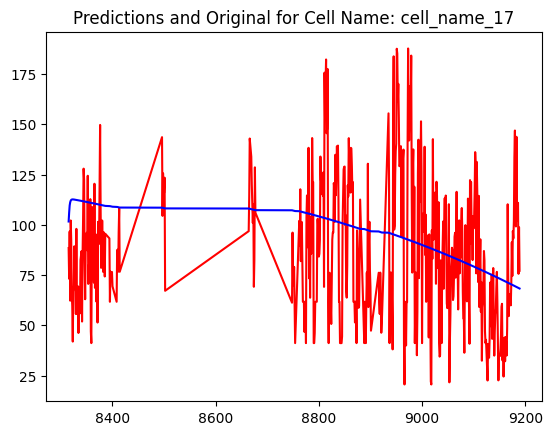

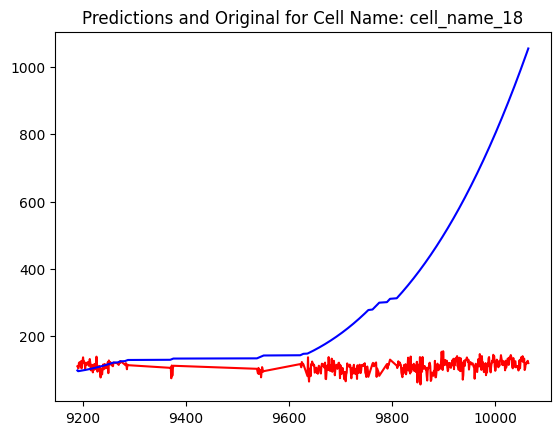

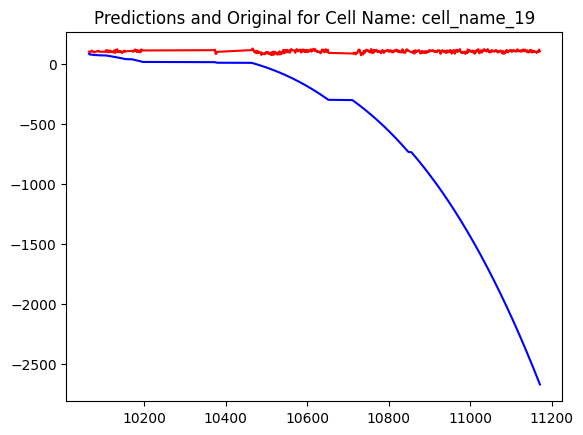

<Figure size 640x480 with 0 Axes>

In [365]:
# Auto arima


for cell_name in cell_names:

    cell_data = df[df['cell_name']==cell_name]

    # Train-Test Split
    train_cell_data, test_cell_data = train_test_split(cell_data, cell_name)

    # Model Training and Selection
    model = auto_arima(train_cell_data.norm_y, m=30, max_order=None, max_p=7, max_q=7, max_d=2, max_P=4, max_Q=4, max_D=2, maxiter=50, alpha=0.05, njobs=-1, trend='ctt', )

    # Prediction
    duration = end_dt - start_dt
    num_days = test_cell_data.norm_y.shape[0]

    predictions = model.predict(num_days)

    # Plotting
    plt.plot(test_cell_data.index, test_cell_data.norm_y, color='red', label='original')
    plt.plot(test_cell_data.index, predictions, color='blue', label='predicted')
    plt.title(f"Predictions and Original for Cell Name: {cell_name}")
    plt.show()
    plt.clf()

    model.summary()

<p>
The predictions give a fair estimate of the actual values, as an initial model for predicting the y values for each cell.
</p>

## Real World Application

<p>
As a telecommunications company, Xplore must deal with this type of data on a daily basis. Many properties of this dataset can be found in real life. The dataset provided datapoints for different cell regions. The y values could potentially be the handshake time between a cell tower and the customer. Alternatively, it could be the average number of subcribers present in the cell.

Careful consideration, modelling, and predicting time-series dataset belonging to each cell, can result in a plethora of applications. Optimizing cell tower ranges, routing traffic, understanging user behaviour to explore business opportunities, etc.

Looking forward to doing all of that and much more!
</p>